In [1]:
import numpy as np
import pandas as pd
import os
from matplotlib import pyplot as plt
from glob import glob
from os import path
from PIL import Image
import pickle
import cv2
from tqdm import tqdm
from transformers import SamProcessor, SamModel
import datasets
from datasets import Dataset, Image
import albumentations
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torch.utils.data import DataLoader as TorchDataset
from torch.optim import Adam
import monai
from tqdm import tqdm
from statistics import mean
import torch
from PIL import Image as PILImage
import datetime
import wandb
from random import randint

/vol/data/miniconda3/envs/DILab/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
DATASET_DIR = "../../data/OCT/Private/Vdata/imagesgreyscale/"
MASKS_DIR = "../../data/OCT/Private/Vdata/masks14/"
color_map = plt.get_cmap("tab20b")
# Segmentation into 14 classes
MASK_COLORS = [color_map(i / 14) for i in range(14)]

In [3]:
def color_mask(mask):
    colored_mask = np.zeros((mask.shape[0], mask.shape[1], 3))
    for i in range(len(mask)):
        for j in range(len(mask[i])):
            colored_mask[i, j] = MASK_COLORS[mask[i, j]][:3]
    return colored_mask

In [4]:
def visualize_file(filename):
    img = np.asarray(PILImage.open(DATASET_DIR + filename))
    mask = np.asarray(PILImage.open(MASKS_DIR + filename))
    colored_mask = color_mask(mask)
    fig, axes = plt.subplots(1, 3, figsize = (30, 8))
    fig.suptitle(filename)
    print(mask.shape)
    mask = (mask == 3).astype(int)
    axes[0].imshow(img, cmap="Greys")
    axes[0].set_title("Image")
    axes[1].imshow(mask, cmap="Greys")
    axes[1].set_title("Mask")
    axes[2].imshow(img, cmap="Greys")
    axes[2].imshow(colored_mask, alpha=0.6)
    axes[2].set_title("Overlay")
    

(496, 512)


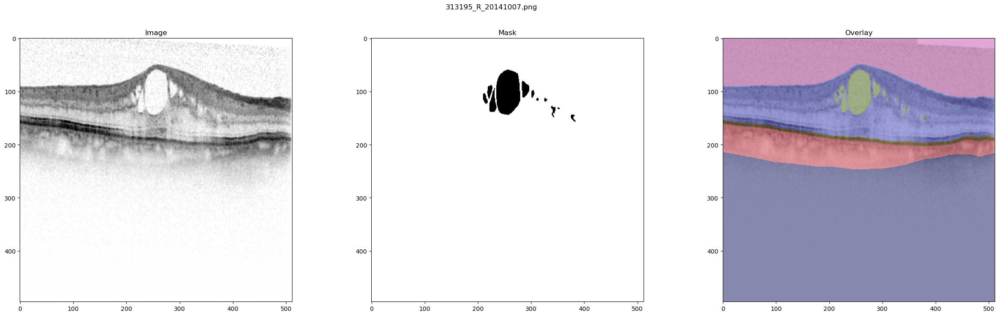

In [5]:
dataset_files = os.listdir(DATASET_DIR)
visualize_file(dataset_files[2])

In [14]:
OCV_COLORMAPS = {
     "Autumn": cv2.COLORMAP_AUTUMN, 
     "Bone": cv2.COLORMAP_BONE,
     "Cividis": cv2.COLORMAP_CIVIDIS, 
     "Cool": cv2.COLORMAP_COOL, 
     "Deepgreen": cv2.COLORMAP_DEEPGREEN,
     "Hot": cv2.COLORMAP_HOT,
     "HSV": cv2.COLORMAP_HSV,
     "Inferno": cv2.COLORMAP_INFERNO,
     "Jet": cv2.COLORMAP_JET,
     "Magma": cv2.COLORMAP_MAGMA,
     "Ocean": cv2.COLORMAP_OCEAN,
     "Parula": cv2.COLORMAP_PARULA,
     "Pink": cv2.COLORMAP_PINK,
     "Plasma": cv2.COLORMAP_PLASMA,
     "Rainbow": cv2.COLORMAP_RAINBOW,
     "Viridis": cv2.COLORMAP_VIRIDIS,
     "Winter": cv2.COLORMAP_WINTER,
     "Spring": cv2.COLORMAP_SPRING,
     "Summer": cv2.COLORMAP_SUMMER,
     "Twilight shifted": cv2.COLORMAP_TWILIGHT_SHIFTED,
     "Twilight": cv2.COLORMAP_TWILIGHT,
     "Turbo": cv2.COLORMAP_TURBO}

def pseudocolor_ocv(filename, plot_cmap=True):
     img = np.asarray(PILImage.open(DATASET_DIR + filename))
     if plot_cmap:
          fig, axes = plt.subplots(6, 4, figsize = (30, 40))
          axes = axes.flatten()
          axes[0].imshow(img, cmap="Greys")
          axes[0].set_title("Initial image")
     recolored_imgs = {"Original": img}
     for i, (key, val) in enumerate(OCV_COLORMAPS.items()):
          recolored_img = cv2.applyColorMap(img, val)
          recolored_imgs[key] = recolored_img
          if plot_cmap:
               axes[i + 1].imshow(recolored_img)
               axes[i + 1].set_title(key)
     return recolored_imgs
          

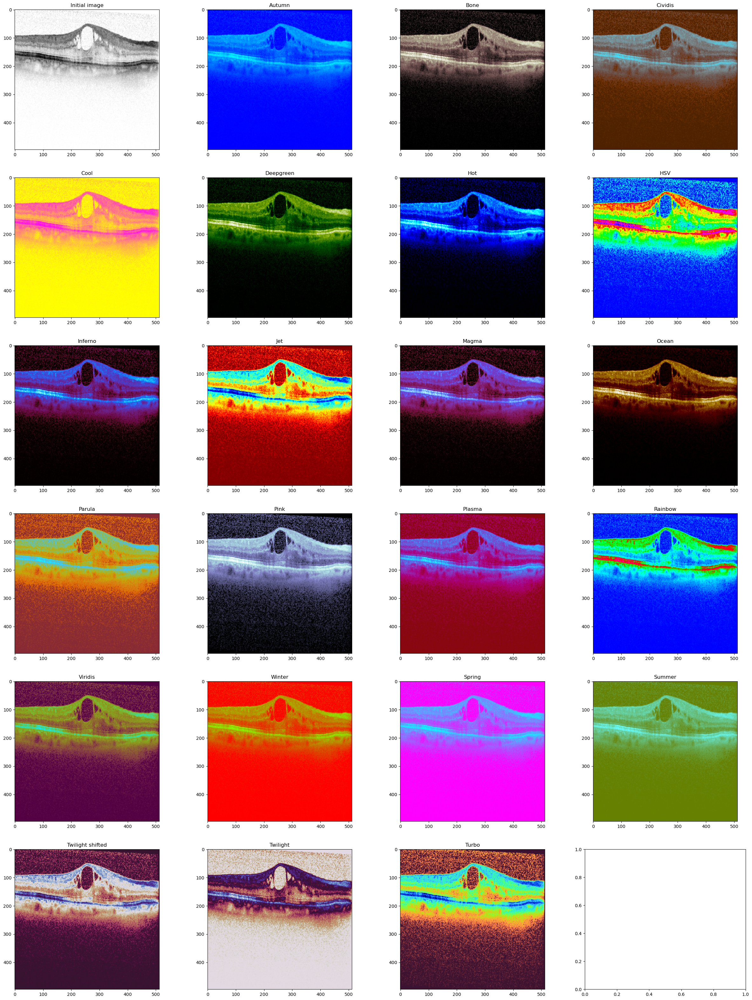

In [15]:
recolored_images = pseudocolor_ocv(dataset_files[2])

In [2]:
RECOLOR_SCHEMA = cv2.COLORMAP_RAINBOW
def preprocess(data_path, preprocessing_folder):
    files = os.fsencode(os.path.join(data_path, "imagesgreyscale"))
    time = datetime.datetime.now().strftime('%y-%m-%d %H.%M.%S')
    images = []
    masks =[]
    images_recolored = []
    for file in os.listdir(files):
        filename = os.fsdecode(file)
        image = cv2.imread(os.path.join(data_path, "imagesgreyscale", filename))
        mask = cv2.imread(os.path.join(data_path, "masks14", filename))
        if mask.shape != (496,512,3) or image.shape != (496,512,3):
            print(filename)
            print(mask.shape)
            print(image.shape)
            continue
        images.append(image)
        images_recolored.append(cv2.applyColorMap(image, RECOLOR_SCHEMA))
        masks.append(mask)
    images = np.stack(images, axis=0)
    masks = np.stack(masks, axis=0)
    images_recolored = np.stack(images_recolored, axis=0)
    dataset = create_dataset(images=images, labels=masks, images_recolored=images_recolored)
    split = dataset.train_test_split(test_size=0.33, shuffle=True)
    split.save_to_disk(preprocessing_folder + time)


def create_dataset(images, labels, images_recolored):
    dataset = Dataset.from_dict({"image": images,
                                 "image_pseudocolor": images_recolored,
                                 "label": labels})
    dataset = dataset.cast_column("image", Image())
    dataset = dataset.cast_column("image_pseudocolor", Image())
    dataset = dataset.cast_column("label", Image())
    return dataset

data_path = "/home/ubuntu/mkonov/DILabHelmholtz/data/OCT/Private/Vdata"
preprocessing_folder = data_path + "/preprocessed/"
preprocess(data_path, preprocessing_folder)

237657_R_20130704.png
(496, 768, 3)
(496, 768, 3)
183307_R_20130312.png
(496, 768, 3)
(496, 768, 3)


In [7]:
def training(base_model, config):
    processor = SamProcessor.from_pretrained(base_model)
    model = SamModel.from_pretrained(base_model)
    #make sure we only compute gradients for mask decoder
    for name, param in model.named_parameters():
        if name.startswith("vision_encoder") or name.startswith("prompt_encoder"):
            param.requires_grad_(False)
    train_dataset = datasets.load_from_disk(config["dataset"])["train"]
    train_dataset.set_transform(transforms)
    train_sam_dataset = SAMDataset(dataset=train_dataset, processor=processor)
    train_dataloader = DataLoader(train_sam_dataset, batch_size=config["batch_size"], shuffle=True)
    valid_dataset = datasets.load_from_disk(config["dataset"])["test"]
    valid_dataset.set_transform(transforms)
    valid_sam_dataset = SAMDataset(dataset=valid_dataset, processor=processor)
    valid_dataloader = DataLoader(valid_sam_dataset, batch_size=config["batch_size"], shuffle=True)
    # Note: Hyperparameter tuning could improve performance here
    optimizer = Adam(model.mask_decoder.parameters(), lr=config["learning_rate"], weight_decay=config["weight_decay"])
    #TODO: Test other losses, implement topological loss
    seg_loss = monai.losses.DiceCELoss(include_background = False, sigmoid=True, squared_pred=True, reduction='mean')
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model.to(device)

    idx = 2
    train_image = train_dataset[idx]["pixel_values"]
    valid_image = valid_dataset[idx]["pixel_values"]
    train_gt = np.array(train_dataset[idx]["label"])
    valid_gt = np.array(valid_dataset[idx]["label"])
    train_gt = np.where(train_gt == config["segnr"], 1.0, 0.0)[:,:,0]
    valid_gt = np.where(valid_gt == config["segnr"], 1.0, 0.0)[:,:,0]
    prompt = [0,0,254,254]
    class_labels = {1: "segmentation"}
    with torch.no_grad():
        inputs = processor(train_image, input_boxes=[[prompt]], return_tensors="pt").to("cuda")
        model.eval()
        outputs = model(**inputs, multimask_output=False)
        medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
        medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
        medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)
        
        train_mask_img = wandb.Image(
            train_dataset[idx]["gray_img"],
            masks={
                "predictions": {"mask_data": medsam_seg, "class_labels": {0: "background", 1: "prediction"}},
                "ground_truth": {"mask_data": np.ones_like(medsam_seg, dtype = int) + train_gt-medsam_seg, "class_labels": {0: "too much prediction", 1: "good",  2: "too little prediction"}},
            },
        )
        inputs = processor(valid_image, input_boxes=[[prompt]], return_tensors="pt").to("cuda")
        model.eval()
        outputs = model(**inputs, multimask_output=False)
        medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
        medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
        medsam_seg = (medsam_seg_prob > 0.5).astype(np.int64)
        valid_mask_img = wandb.Image(
            valid_dataset[idx]["gray_img"],
            masks={
                "predictions": {"mask_data": medsam_seg, "class_labels": {0: "background", 1: "prediction"}},
                "ground_truth": {"mask_data": np.ones_like(medsam_seg, dtype = int) + valid_gt-medsam_seg, "class_labels": {0: "too much prediction", 1: "good",  2: "too little prediction"}},
            },
        )
        wandb.log({"predictions" :[train_mask_img, valid_mask_img]})
    for epoch in range(config["epochs"]):
        model.train()
        train_epoch_loss = 0
        for batch in tqdm(train_dataloader):
            # forward pass
            outputs = model(pixel_values=batch["pixel_values"].to(device),
                            input_boxes=batch["input_boxes"].to(device),
                            multimask_output=False)

            # compute loss
            predicted_masks = outputs.pred_masks.squeeze(1)
            ground_truth_masks = batch["ground_truth_mask"].float().to(device)
            ground_truth_masks = torch.where(ground_truth_masks == config["segnr"], 1.0, 0.0).unsqueeze(1)[:,:,:,:,0]
            train_loss = seg_loss(predicted_masks, ground_truth_masks)
            # backward pass (compute gradients of parameters w.r.t. loss)
            optimizer.zero_grad()
            train_loss.backward()
            # optimize
            optimizer.step()
            train_epoch_loss += train_loss.item()
        wandb.log({"train/train_loss": train_epoch_loss,
                    "train/epoch": epoch})
        valid_epoch_loss = validate_model(model, valid_dataloader, seg_loss, config)

        print(f'EPOCH: {epoch}, Train Loss: {train_epoch_loss}, Valid Loss: {valid_epoch_loss}')
        with torch.no_grad():
            inputs = processor(train_image, input_boxes=[[prompt]], return_tensors="pt").to("cuda")
            model.eval()
            outputs = model(**inputs, multimask_output=False)
            medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
            medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
            medsam_seg = (medsam_seg_prob > 0.5).astype(np.int64)
            train_mask_img = wandb.Image(
                train_dataset[idx]["gray_img"],
                masks={
                    "predictions": {"mask_data": medsam_seg, "class_labels": {0: "background", 1: "prediction"}},
                    "ground_truth": {"mask_data": np.ones_like(medsam_seg, dtype = int) + train_gt-medsam_seg, "class_labels": {0: "too much prediction", 1: "good",  2: "too little prediction"}},
                },
            )
            inputs = processor(valid_image, input_boxes=[[prompt]], return_tensors="pt").to("cuda")
            model.eval()
            outputs = model(**inputs, multimask_output=False)
            medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
            medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
            medsam_seg = (medsam_seg_prob > 0.5).astype(np.int64)
            valid_mask_img = wandb.Image(
                valid_dataset[idx]["gray_img"],
                masks={
                    "predictions": {"mask_data": medsam_seg, "class_labels": {0: "background", 1: "prediction"}},
                    "ground_truth": {"mask_data": np.ones_like(medsam_seg, dtype = int) + valid_gt-medsam_seg, "class_labels": {0: "too much prediction", 1: "good",  2: "too little prediction"}},
                },
            )
            wandb.log({"predictions" :[train_mask_img, valid_mask_img]})
    torch.save(model.state_dict(), config["checkpoint"] + "chkpt.pt")
    wandb.finish()


def transforms(batch):
    transform = albumentations.Compose([albumentations.Resize(256, 256),])
    transformed_images, transformed_masks, transformed_gray = [], [], []
    for gray_image, image, seg_mask in zip(batch["image"], batch["image_pseudocolor"], batch["label"]):
        gray_image, image, seg_mask = np.array(gray_image), np.array(image), np.array(seg_mask)
        seg_mask[0,0] = 1
        transformed = transform(image=image, mask=seg_mask)
        transformed_images.append(transformed["image"])
        transformed_masks.append(transformed["mask"])
        transformed_gray.append(transform(image=gray_image)["image"])
    batch["pixel_values"] = transformed_images
    batch["label"] = transformed_masks
    batch["gray_img"] = transformed_gray
    return batch

def validate_model(model, valid_dl, seg_loss, config, log_images=False, batch_idx=0):
    "Compute performance of the model on the validation dataset and log a wandb.Table"
    device = "cuda:0" if torch.cuda.is_available() else "cpu"
    model.eval()
    valid_epoch_loss = 0.
    with torch.inference_mode():
        for batch in tqdm(valid_dl):
            # forward pass
            outputs = model(pixel_values=batch["pixel_values"].to(device),
                            input_boxes=batch["input_boxes"].to(device),
                            multimask_output=False)

            # compute loss
            predicted_masks = outputs.pred_masks.squeeze(1)
            ground_truth_masks = batch["ground_truth_mask"].float().to(device)
            ground_truth_masks = torch.where(ground_truth_masks == config["segnr"], 1.0, 0.0).unsqueeze(1)[:,:,:,:,0]
            valid_loss = seg_loss(predicted_masks, ground_truth_masks)
            # backward pass (compute gradients of parameters w.r.t. loss)
            valid_epoch_loss += valid_loss.item()
        wandb.log({"val/valid_loss": valid_epoch_loss})
    return valid_epoch_loss




def visualize_seg_mask(image: np.ndarray, mask: np.ndarray):
    color_seg = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    color_seg[mask == 0, :] = [255,255,255]
    #color_seg[mask == 1, :] = [255,255,255]
    color_seg[mask == 1, :] = [255,0,0]
    color_seg = color_seg[..., ::-1]  # convert to BGR
    img = np.array(image) * 0.5 + color_seg * 0.5  # plot the image with the segmentation map
    img = img.astype(np.uint8)
    plt.figure(figsize=(15, 10))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def get_bounding_box(ground_truth_map):
    """
    # get bounding box from mask
    y_indices, x_indices = np.where(ground_truth_map > 0)
    x_min, x_max = np.min(x_indices), np.max(x_indices)
    y_min, y_max = np.min(y_indices), np.max(y_indices)
    # add perturbation to bounding box coordinates
    H, W = ground_truth_map.shape
    x_min = max(0, x_min)
    x_max = min(W, x_max)
    y_min = max(0, y_min)
    y_max = min(H, y_max)
    bbox = [x_min, y_min, x_max, y_max]
    """
    bbox =[0,0,255,255]
    return bbox
"""
def get_bounding_box(bbox):
    v = [randint(0, v) for v in (255,255,255,255)]
    left = min(v[0], v[2])
    upper = min(v[1], v[3])
    right = max(v[0], v[2])
    lower = max(v[1], v[3])
    return [left, upper, right, lower]
"""

class SAMDataset(TorchDataset):
    def __init__(self, dataset, processor):
        self.dataset = dataset
        self.processor = processor

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item["pixel_values"]
        ground_truth_mask = np.array(item["label"])
        # get bounding box prompt
        prompt = get_bounding_box(ground_truth_mask)
        """
        #new
        first_slice = slice(prompt[0], prompt[2] + 1)
        second_slice = slice(prompt[1], prompt[3] + 1)
        gt = np.zeros_like(ground_truth_mask)
        gt[first_slice, second_slice] = ground_truth_mask[first_slice, second_slice]
        ground_truth_mask = gt
        """
        # prepare image and prompt for the model
        inputs = self.processor(image, input_boxes=[[prompt]], return_tensors="pt")
        # remove batch dimension which the processor adds by default
        inputs = {k:v.squeeze(0) for k,v in inputs.items()}
        # add ground truth segmentation
        inputs["ground_truth_mask"] = ground_truth_mask
        return inputs

In [8]:
torch.cuda.empty_cache()

mask_dict = (
    "background",
    "epiretinal membrane",
    "neurosensory retina",
    "intraretinal fluid",
    "subretinal fluid",
    "subretinal hyperreflective material",
    "retinal pigment epithelium",
    "pigment epithelial detachment",
    "posterior hyaloid membrane",
    "choroid border",
    "imaging artifacts",
    "fibrosis",
    "vitreous body",
    "image padding" 
)


project_name = "dilaboct"
entity = "konovma"
base_models = ["facebook/sam-vit-base", "facebook/sam-vit-huge", "facebook/sam-vit-large", "wanglab/medsam-vit-base"]
base_model = base_models[0]
data_path = "/home/ubuntu/mkonov/DILabHelmholtz/data/OCT/Private/Vdata/preprocessed/"

preprocessed_dataset = "23-12-18_15.52.02"

for i in [3]:
    time = datetime.datetime.now().strftime('%y-%m-%d_%H.%M.%S')
    checkpoint_path = "/home/ubuntu/mkonov/DILabHelmholtz/models/OCT/model_checkpoints/" + time

    display_name = "1e-3 lr, 0 wd, 16 bs, dice loss, 256, rainbow"
    #display_name = base_model + " " + time
    config = {
        "learning_rate": 1e-3,
        "weight_decay": 0,
        "epochs": 10,
        "batch_size": 16,
        "data_path": data_path,
        "dataset": data_path + preprocessed_dataset,
        "loss": "dice",
        "checkpoint": checkpoint_path,
        "time": time,
        "segnr": i
    }


    wandb.init(
         project=project_name,
         entity=entity,
         name=display_name,
         config=config
    )
    training(base_model, config)

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


train/epoch,▁▃▅▆█
train/train_loss,█▂▁▁▁
val/valid_loss,█▁▁▁
train/epoch,4
train/train_loss,8.79375
val/valid_loss,3.6749


  0%|          | 0/23 [00:00<?, ?it/s]/vol/data/miniconda3/envs/DILab/lib/python3.11/site-packages/monai/losses/dice.py:161: UserWarning: single channel prediction, `include_background=False` ignored.
  warnings.warn("single channel prediction, `include_background=False` ignored.")
100%|██████████| 12/12 [00:32<00:00,  2.71s/it]


EPOCH: 0, Train Loss: 21.151034146547318, Valid Loss: 4.811844512820244


100%|██████████| 12/12 [00:32<00:00,  2.68s/it]


EPOCH: 1, Train Loss: 9.558319389820099, Valid Loss: 3.760620634071529


100%|██████████| 12/12 [00:32<00:00,  2.69s/it]


EPOCH: 2, Train Loss: 8.862902075052261, Valid Loss: 3.5654133589705452


100%|██████████| 12/12 [00:32<00:00,  2.71s/it]


EPOCH: 3, Train Loss: 8.74760015308857, Valid Loss: 3.9324731454253197


100%|██████████| 12/12 [00:31<00:00,  2.65s/it]


EPOCH: 4, Train Loss: 8.758874505758286, Valid Loss: 3.6849527060985565


 87%|████████▋ | 20/23 [00:58<00:08,  2.94s/it]


KeyboardInterrupt: 

In [11]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


In [30]:
torch.cuda.empty_cache()